# YOLO using v5 weights

In [ ]:
!gdown 1Y5OHRq4KPVZuvY2BnuUnsEXq9o_GuzBM

Downloading...
From (original): https://drive.google.com/uc?id=1Y5OHRq4KPVZuvY2BnuUnsEXq9o_GuzBM
From (redirected): https://drive.google.com/uc?id=1Y5OHRq4KPVZuvY2BnuUnsEXq9o_GuzBM&confirm=t&uuid=898fd808-34ef-4f83-8586-86186a4fa1ad
To: /content/selfdriving cars data.zip
100% 946M/946M [00:10<00:00, 87.1MB/s]


In [ ]:
!unzip -q '/content/selfdriving cars data.zip'

replace __MACOSX/._selfdriving cars data? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
from glob import glob

In [ ]:
glob('/content/selfdriving cars data/images/*jpg')[:2]

['/content/selfdriving cars data/images/1479499539043554050.jpg',
 '/content/selfdriving cars data/images/1479501933206171609.jpg']

In [ ]:
import matplotlib.pyplot as plt

(300, 480, 3)


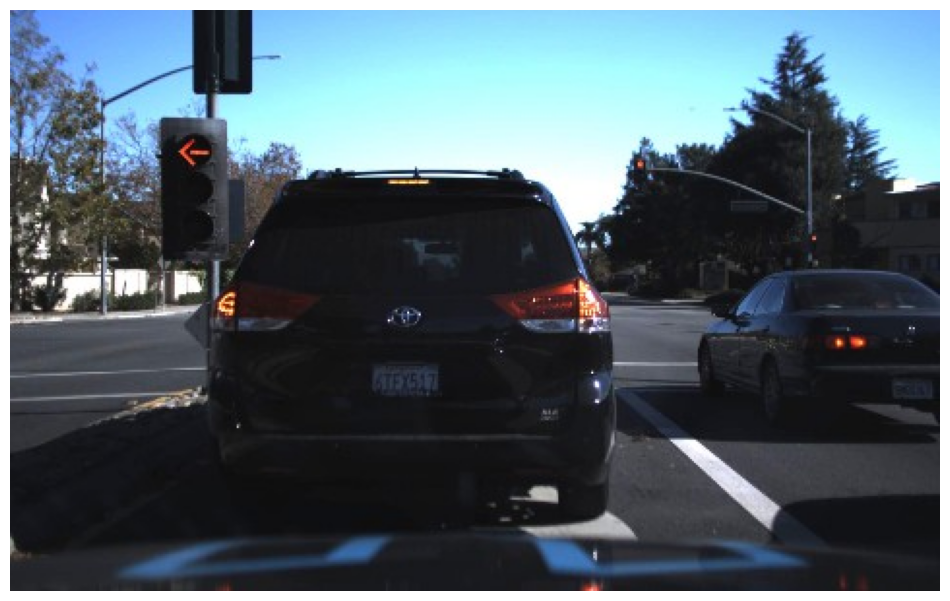

(300, 480, 3)


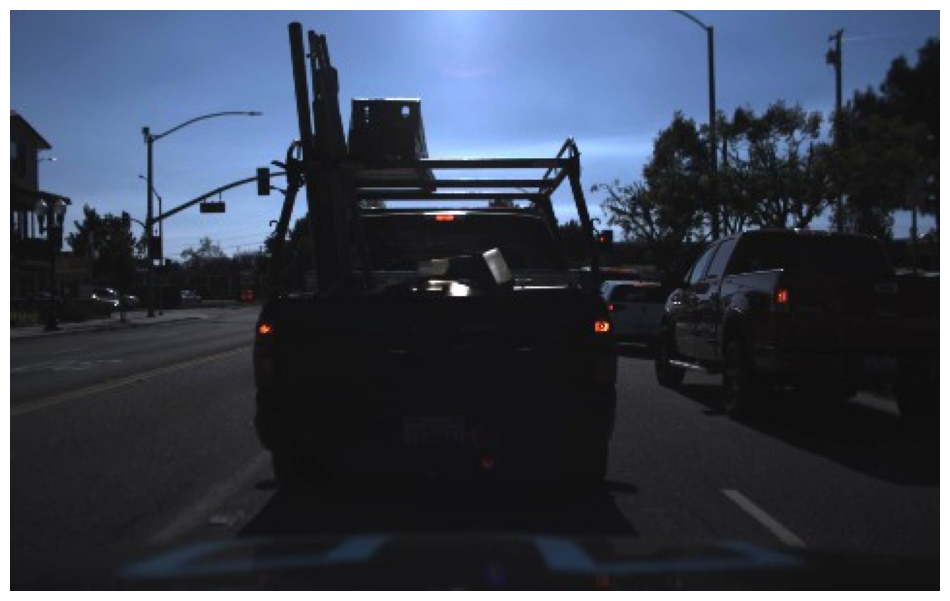

In [ ]:
for img_path in glob('/content/selfdriving cars data/images/*jpg')[:2]:
  plt.figure(figsize=(12,8))
  img=plt.imread(img_path)
  print(img.shape)
  plt.imshow(img)
  plt.axis('off')
  plt.show()

In [ ]:
!gdown 1g7BocB3bO9l3qk8pzBmn7F32A9ib3Tf2

Downloading...
From (original): https://drive.google.com/uc?id=1g7BocB3bO9l3qk8pzBmn7F32A9ib3Tf2
From (redirected): https://drive.google.com/uc?id=1g7BocB3bO9l3qk8pzBmn7F32A9ib3Tf2&confirm=t&uuid=6092c515-d28e-45bd-98b1-dbfd555aee34
To: /content/YoloV5_ONNX.zip
100% 31.3M/31.3M [00:01<00:00, 26.3MB/s]


In [ ]:
!unzip -q '/content/YoloV5_ONNX.zip'

In [ ]:
classesFile='/content/coco.names.txt'
classes=None
with open(classesFile,'rt') as f:
  classes=f.read().rstrip('\n').split('\n')

print(dict(enumerate(classes)))

{0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorbike', 4: 'aeroplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'sofa', 58: 'pottedplant', 59: 'bed', 60: 'diningtable', 61: 'toilet', 62: 'tvmonitor', 63: 'laptop', 64: 'mouse', 65: 'remote', 66: 'keyboard', 67: 'cell phone', 68: 'mi

In [ ]:
import cv2
import numpy as np

In [ ]:
INPUT_WIDTH=640
INPUT_HEIGHT=640

OBJECT_SCORE_THRESHOLD=0.5

CLASS_CONFIDENCE_THRESHOLD=0.45

NMS_THRESHOLD=0.45

FONT_FACE=cv2.FONT_HERSHEY_SIMPLEX
FONT_SCALE=0.4
THICKNESS=1
BOX_COLOR=(0,255,255)
FONT_COLOR=(0,0,0)

In [ ]:
def draw_label(im,label,x,y):
  """Function used for Drawing text/label onto image at location."""

  text_size=cv2.getTextSize(label,FONT_FACE,FONT_SCALE,THICKNESS)
  dim,baseline=text_size[0],text_size[1]

  cv2.rectangle(im,(x,y),(x+dim[0],y-(dim[1]+baseline)),(255,255,255),cv2.FILLED)

  cv2.putText(im,label,(x,y-dim[1]+baseline),FONT_FACE,FONT_SCALE,FONT_COLOR,THICKNESS,cv2.LINE_AA)

In [ ]:
def yolo_forward_pass(input_image,net):
  """Performs forward pass to generate prediction using image and Loaded Yolo Model as parameters """

  blob=cv2.dnn.blobFromImage(input_image,1/255,(INPUT_WIDTH,INPUT_HEIGHT),[0,0,0],1,crop=False)

  net.setInput(blob)

  outputs=net.forward(net.getUnconnectedOutLayersNames())

  return outputs

In [ ]:
def post_process_outputs(input_image,outputs):

  """ Takes Model Prediction outputs from forward pass function and performs post-processing tasks:
  1. Removing predictions with Low Confidence score
  2. Filtering only classes required for our task such as
  Vehicles, Human, traffic light stop sgn etc
  3. Perform NMS to suppress redundant or Duplicate boxes
  4. Annotate/draw remaining boxes on the Image
  """

  class_ids=[]
  confidences=[]
  boxes=[]

  # print(outputs[0].shape)
  # print(input_image.shape)
  rows=outputs[0].shape[1]
  image_height, image_width = input_image.shape[:2]

  x_factor=image_width/INPUT_WIDTH
  y_factor=image_height/INPUT_HEIGHT

  # print(x_factor,y_factor)

  # print(outputs[0][0][0])

  for i in range(rows):
    row=outputs[0][0][i]
    confidence=row[4]

    # print('row:\n',row)
    # print('confidence:\n',confidence)

    if confidence>=OBJECT_SCORE_THRESHOLD:
      classes_scores=row[5:]

      class_id=np.argmax(classes_scores)

      # print('class_id\n:',class_id)

      if (classes_scores[class_id]>CLASS_CONFIDENCE_THRESHOLD):
        class_ids.append(class_id)
        confidences.append(confidence)

        cx,cy,w,h=row[0],row[1],row[2],row[3]

        left=int((cx-w/2)*x_factor)
        top=int((cy-h/2)*y_factor)
        width=int(w*x_factor)
        height=int(h*y_factor)

        box=np.array([left,top,width,height])
        boxes.append(box)


  # filter redundant Boxes using NMS Threshold
  indices=cv2.dnn.NMSBoxes(boxes,confidences,CLASS_CONFIDENCE_THRESHOLD,NMS_THRESHOLD)

  # print('indices:\n',indices)

  for i in indices:
    box=boxes[i]
    # print('box values:\n',box)
    left=box[0]
    top=box[1]
    widht=box[2]
    height=box[3]

    cv2.rectangle(input_image,(left,top),(left+widht,top+height),BOX_COLOR,2*THICKNESS)

    label=f"{classes[class_ids[i]]}:{confidences[i]:.2f}"

    draw_label(input_image,label,left,top)

  return input_image


In [ ]:
from google.colab.patches import cv2_imshow

In [ ]:
sample_images = ['/content/selfdriving cars data/images/1478732518231513348.jpg',
 '/content/selfdriving cars data/images/1478900224707428956.jpg',
 '/content/selfdriving cars data/images/1478898970726449449.jpg',
 '/content/selfdriving cars data/images/1478895374457789828.jpg',
 '/content/selfdriving cars data/images/1479504796899191419.jpg',
 '/content/selfdriving cars data/images/1479498467969466999.jpg']

In [ ]:
# Load the model using cv2.dnn.readNet: Yolo V5 Nano Model

modelWeights='/content/yolov5n.onnx'
net=cv2.dnn.readNet(modelWeights)

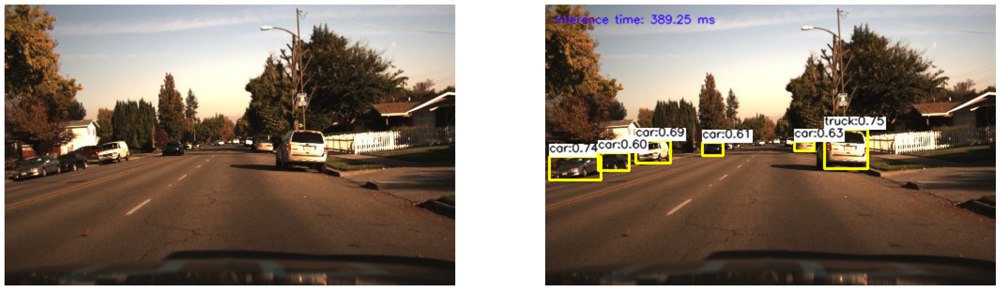

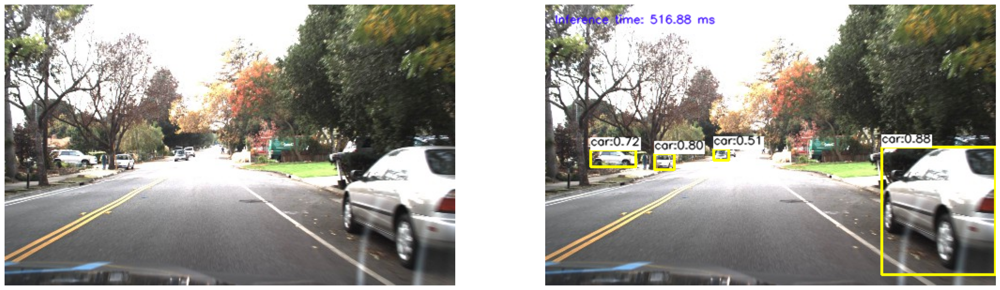

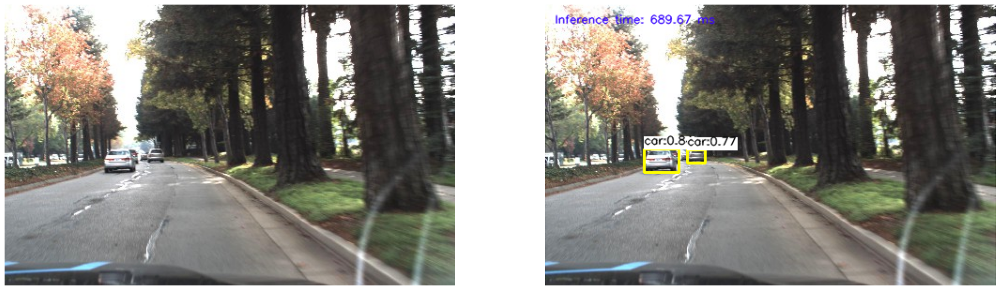

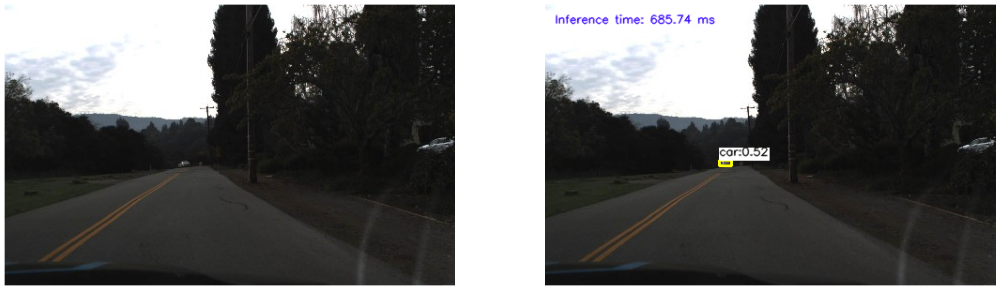

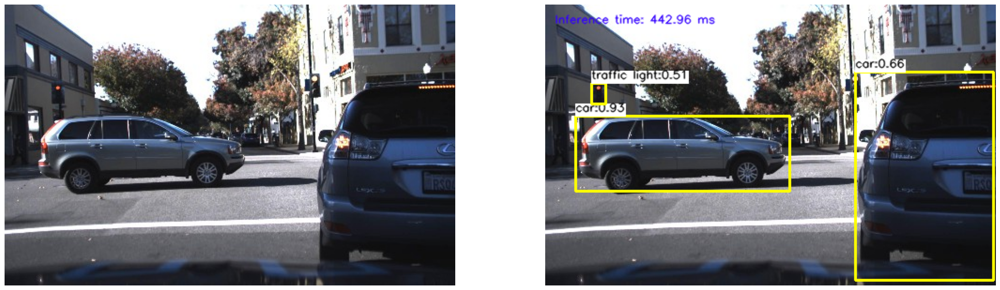

...

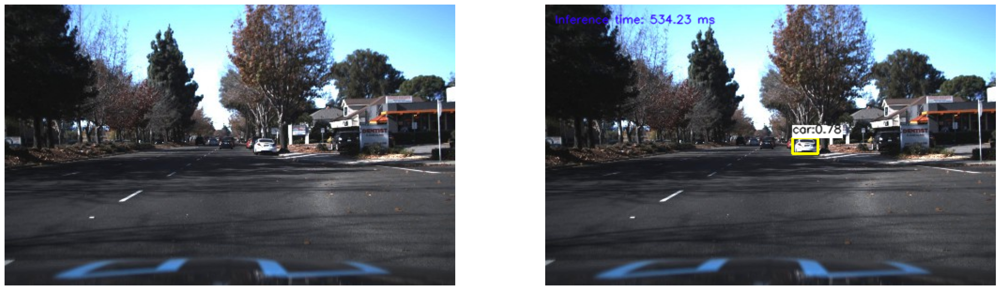

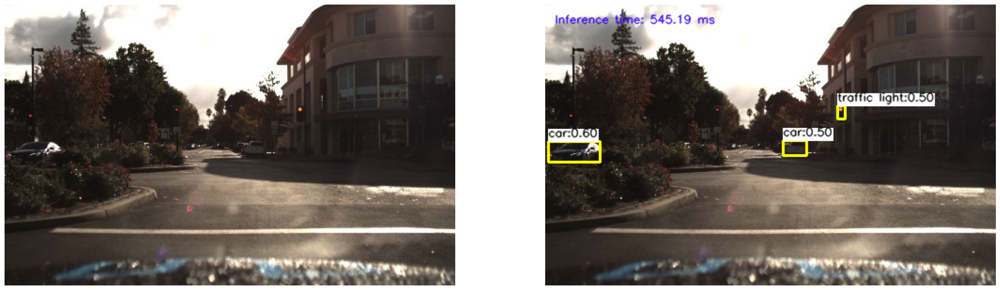

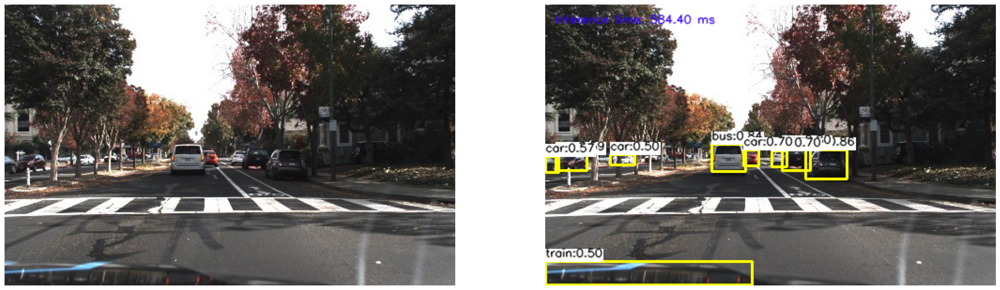

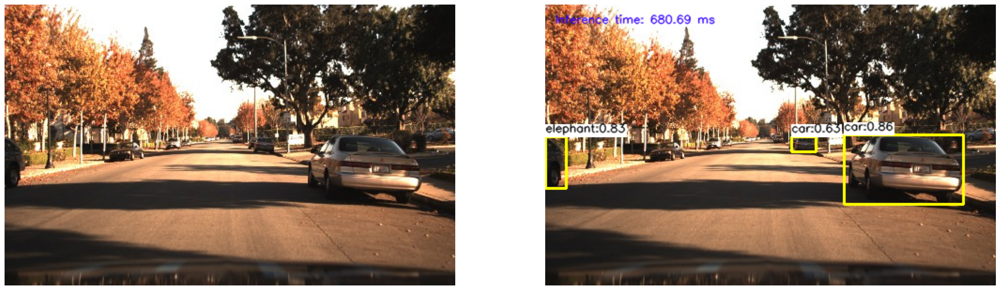

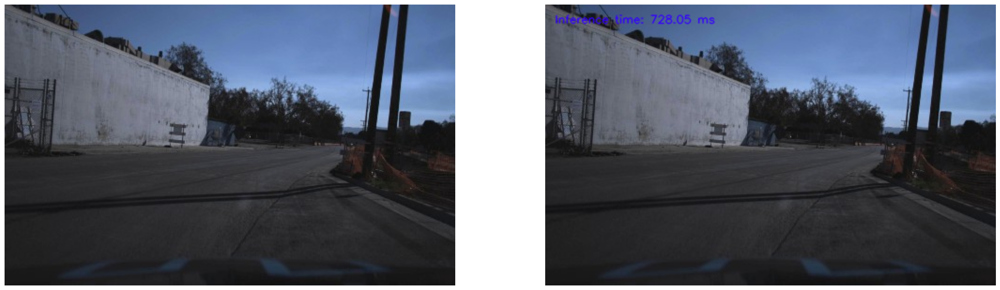

In [ ]:
for img_path in sample_images+glob('/content/selfdriving cars data/images/*jpg')[:10]:
  frame=cv2.imread(img_path)

  detections=yolo_forward_pass(frame,net)

  # print(detections)

  pred_img=post_process_outputs(frame.copy(),detections)

  # print(pred_img)

  """
  Annotate efficiency information. The function getPerfProfile returns the overall time for inference(t)
  and the timings for each of the layers(in layersTimes).
  """

  t,_=net.getPerfProfile()
  label="Inference time: %.2f ms" % (t*1000.0/cv2.getTickFrequency())
  cv2.putText(pred_img,label,(10,20),FONT_FACE, FONT_SCALE,  (255, 0, 50), THICKNESS, cv2.LINE_AA)

  fig=plt.figure(figsize=(28,16))
  ax1=fig.add_subplot(1,2,1)
  frame=cv2.cvtColor(frame,cv2.COLOR_BGR2RGB)
  ax1.imshow(frame)
  ax1.axis('off')

  ax2 = fig.add_subplot(1,2,2)
  pred_img = cv2.cvtColor(pred_img, cv2.COLOR_BGR2RGB )
  ax2.imshow(pred_img)
  ax2.axis('off')

  plt.show()